# Stimuli Analysis for a Voice Discrimination Behavioral Experiment

The aim of this notebook is to prepare the stimuli that will be used in the behavioral experiment. To do so, we perform some analyses on datasets to evaluate how a model can *place* a speaker in its encoding space. How do models encode speakers' identities? How far are these encoded representations from each other? Would the distances between speaker in this space correlate to the ability of a model to recognize/discriminate between them properly? e.g. the further the speakers from each other the easier for the model to discriminate.

Accordingly, we compute different metrics across speakers' utterances to first show correlations between recognizability and distance/similarity variables. Then, indicate which variable is more convenient to compile the stimuli based on it. These stimuli will be further used in a behavioral experiment to evaluate human performance.

Thus, we will be selecting the stimuli from three different datasets; [Librispeech](https://ieeexplore.ieee.org/document/7178964), [VCTK](https://datashare.ed.ac.uk/handle/10283/3443) and [TIMIT](https://catalog.ldc.upenn.edu/LDC93s1). Find below the framework for stimuli selection and analysis:

1. Compile 3sec clips from the three corpora
2. Normalize loudness to -23dB
3. Extract speaker embeddings using the weights of the best HuBERT layer reported in the [VoxCeleb benchmark](https://gasserelbanna.github.io/vocal-identity-jupyter-book/5_chapter1/voxceleb_benchmark.html).
4. Compute distance and similarity metrics (e.g. euclidean, cosine, hausdorff, and spearman correlation).
5. Plot confusion matrix across speakers and multi-modal histograms for Same/Different pairs
6. Select the overlapping subset from the historgram of each subset
7. Extract the set of pairs that is common across all metrics
8. Sort these pairs based on a score (average of all metrics)
9. Pick 50 *Same* pairs with the largest score and 50 *Different* pairs with the smallest score. (Manual filtering included)
10. Add background noise to stimuli
11. Divide stimuli into Noisy-Clean (N-C) and Clean-Noisy (C-N) pairs
12. Save final set of stimuli to be used for Gorilla.
13. Filter recruited subjects for the experiment
14. Analyze approved subjects' data

In [1]:
#Importing some packages
import os
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
from glob import glob
import soundfile as sf
import deciphering_enigma
import matplotlib.pyplot as plt

################################################################################
### WARNING, path does not exist: KALDI_ROOT=/mnt/matylda5/iveselyk/Tools/kaldi-trunk
###          (please add 'export KALDI_ROOT=<your_path>' in your $HOME/.profile)
###          (or run as: KALDI_ROOT=<your_path> python <your_script>.py)
################################################################################



In [2]:
#Plotting settings
import matplotlib
from pylab import cm
import matplotlib as mpl
matplotlib.font_manager._fmcache
matplotlib.font_manager._rebuild()
mpl.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.linewidth'] = 3

## 1) Load Dataset with Metadata

In [3]:
#define the experiment config file path
path_to_config = './config.yaml'

#read the experiment config file
exp_config = deciphering_enigma.load_yaml_config(path_to_config)

### Librispeech

In [7]:
#compile librispeech audio files from the test set (test-clean and test-other) (the original files were chuncked to 3sec clips)
librispeech_audios = glob('/om2/user/gelbanna/datasets/LibriSpeech/LibriSpeech/chuncked_3sec/test-*/*/*/*.flac')
print(f'Dataset has {len(librispeech_audios)} samples')

#extract metadata from file name convention
libri_df = pd.DataFrame({'Path': librispeech_audios})
libri_df['FileName'] = np.array(list(map(lambda x: x.split('/')[-1], librispeech_audios)))
libri_df['ID'] = np.array(list(map(lambda x: x.split('/')[-1].split('-')[0], librispeech_audios)))
libri_df['Scentence'] = np.array(list(map(lambda x: x.split('/')[-2], librispeech_audios)))

#read speakers data for librispeech dataset
speaker_df = pd.read_csv('/om2/user/gelbanna/datasets/LibriSpeech/LibriSpeech/SPEAKERS.TXT', delimiter='|')
speaker_df.drop(columns=['MINUTES','SUBSET', 'NAME'], inplace=True)
speaker_df.rename(columns={'SEX': 'Sex'}, inplace=True)
speaker_df.ID = speaker_df.ID.astype(str)
#merge both dataframes on ID
libri_df = libri_df.merge(speaker_df, on='ID', how='left')

libri_df.sample(10)

Dataset has 10050 samples


,Path,FileName,ID,Scentence,Sex
8593,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,6128-63241-0003_000.flac,6128,63241,F
2463,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,4507-16021-0017_000.flac,4507,16021,F
9660,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,8188-269288-0035_001.flac,8188,269288,M
372,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,121-127105-0026_001.flac,121,127105,F
2108,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,3729-6852-0009_004.flac,3729,6852,F
6271,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,3331-159605-0016_003.flac,3331,159605,F
536,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1284-1180-0001_001.flac,1284,1180,F
6690,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,367-130732-0005_001.flac,367,130732,F
2449,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,4507-16021-0010_003.flac,4507,16021,F
816,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1580-141083-0012_000.flac,1580,141083,F


In [8]:
print(f'Number of speakers: {libri_df.ID.unique().shape[0]}')
print(f'Number of utterances: {len(libri_df)}')

Number of speakers: 73
Number of utterances: 10050


### VCTK

In [9]:
#compile all vctk audio files
vctk_audios = glob('/om2/user/gelbanna/datasets/VCTK/wav48_silence_trimmed/*/*mic1.flac')
print(f'Dataset has {len(vctk_audios)} samples')

#extract metadata from file name convention
vctk_df = pd.DataFrame({'Path': vctk_audios})
vctk_df['FileName'] = np.array(list(map(lambda x: x.split('/')[-1], vctk_audios)))
vctk_df['ID'] = np.array(list(map(lambda x: x.split('/')[-2], vctk_audios)))
vctk_df['Scentence'] = np.array(list(map(lambda x: x.split('/')[-1].split('_')[1], vctk_audios)))

#read speakers data for librispeech dataset
speaker_df = pd.read_csv('/om2/user/gelbanna/datasets/VCTK/speaker-info.txt', delim_whitespace=True, index_col=False)
speaker_df.drop(columns=['ACCENTS','REGION', 'AGE'], inplace=True)
speaker_df.rename(columns={'GENDER': 'Sex'}, inplace=True)
speaker_df['ID'] = 'p' + speaker_df['ID'].astype(str)
#merge both dataframes on ID
vctk_df = vctk_df.merge(speaker_df, on='ID', how='left')

#compute audio duration (to filter only 3sec clips)
dur = []
for file in tqdm(vctk_audios):
    audio, sr = sf.read(file)
    dur.append(len(audio)/sr)
vctk_df['Duration'] = dur

vctk_df.sample(10)

Dataset has 44455 samples


100%|█████████████████████████████████████████████████████████████████████████| 44455/44455 [04:31<00:00, 163.62it/s]


,Path,FileName,ID,Scentence,Sex,Duration
22935,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p283_179_mic1.flac,p283,179,F,2.988458
6714,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p244_092_mic1.flac,p244,092,F,2.049604
1855,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p230_144_mic1.flac,p230,144,F,5.464812
10746,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p254_193_mic1.flac,p254,193,M,2.479875
8097,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p247_345_mic1.flac,p247,345,M,2.220188
10043,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p252_268_mic1.flac,p252,268,M,3.011125
29581,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p303_232_mic1.flac,p303,232,F,4.341938
36065,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p326_363_mic1.flac,p326,363,M,3.234208
10117,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p252_345_mic1.flac,p252,345,M,2.406833
20329,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p277_081_mic1.flac,p277,081,F,1.921083


In [10]:
#keep the audios that are 2.8-3sec long
vctk_df = vctk_df.loc[(vctk_df.Duration <= 3) & (vctk_df.Duration >= 2.8)]
vctk_df.drop(columns=['Duration'], inplace=True)
print(f'Number of speakers: {vctk_df.ID.unique().shape[0]}')
print(f'Number of utterances: {len(vctk_df)}')

Number of speakers: 110
Number of utterances: 4384


### TIMIT

In [11]:
#compile TIMIT audio files
timit_audios = glob('/om2/user/gelbanna/datasets/TIMIT/*/*/*/*.WAV')
print(f'Dataset has {len(timit_audios)} samples')

#extract metadata from file name convention
timit_df = pd.DataFrame({'Path': timit_audios})
timit_df['FileName'] = np.array(list(map(lambda x: x.split('/')[-1], timit_audios)))
timit_df['ID'] = np.array(list(map(lambda x: x.split('/')[-2][1:], timit_audios)))
timit_df['Scentence'] = np.array(list(map(lambda x: x.split('/')[-1].split('.')[0], timit_audios)))
timit_df['Sex'] = np.array(list(map(lambda x: x.split('/')[-2][0], timit_audios)))

#compute audio duration (to filter only 3sec clips)
dur = []
for file in tqdm(timit_audios):
    audio, sr = sf.read(file)
    dur.append(len(audio)/sr)
timit_df['Duration'] = dur

timit_df.sample(10)

Dataset has 6300 samples


100%|███████████████████████████████████████████████████████████████████████████| 6300/6300 [00:20<00:00, 300.38it/s]


,Path,FileName,ID,Scentence,Sex,Duration
266,/om2/user/gelbanna/datasets/TIMIT/TEST/DR2/MJA...,SX278.WAV,JAR0,SX278,M,3.660813
2865,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR3/FD...,SX125.WAV,DJH0,SX125,F,2.393625
89,/om2/user/gelbanna/datasets/TIMIT/TEST/DR1/MSJ...,SX99.WAV,SJS1,SX99,M,2.502438
3169,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR3/MD...,SX45.WAV,DLC0,SX45,M,2.944000
5989,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR7/MT...,SX77.WAV,TER0,SX77,M,2.886437
1714,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR1/FE...,SI788.WAV,ECD0,SI788,F,5.158437
4818,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR5/MR...,SX424.WAV,RLD0,SX424,M,2.636813
6001,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR7/MT...,SA2.WAV,TLC0,SA2,M,2.585625
557,/om2/user/gelbanna/datasets/TIMIT/TEST/DR3/MMD...,SX306.WAV,MDH0,SX306,M,2.553625
4567,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR5/MD...,SX292.WAV,DSJ0,SX292,M,3.494438


In [12]:
#keep the audios that are 2.8-3sec long
timit_df = timit_df.loc[(timit_df.Duration <= 3) & (timit_df.Duration >= 2.8)]
timit_df.drop(columns=['Duration'], inplace=True)
print(f'Number of speakers: {timit_df.ID.unique().shape[0]}')
print(f'Number of utterances: {len(timit_df)}')

Number of speakers: 416
Number of utterances: 655


In [13]:
#concatenate all dfs together
df = pd.concat([libri_df, vctk_df, timit_df])
print(f'Total number of speakers: {df.ID.unique().shape[0]}')
df.to_csv(f'../{exp_config.dataset_name}/compiled_data.csv')
df

Total number of speakers: 599


,Path,FileName,ID,Scentence,Sex
0,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1089-134686-0000_000.flac,1089,134686,M
1,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1089-134686-0000_001.flac,1089,134686,M
2,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1089-134686-0000_002.flac,1089,134686,M
3,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1089-134686-0001_000.flac,1089,134686,M
4,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1089-134686-0002_000.flac,1089,134686,M
...,...,...,...,...,...
6220,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MM...,SA1.WAV,MEA0,SA1,M
6237,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MM...,SX357.WAV,MLM0,SX357,M
6243,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MM...,SI1691.WAV,MPM0,SI1691,M
6251,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MM...,SA2.WAV,MWS0,SA2,M


In [9]:
#Read metadata for the compiled sample
df = pd.read_csv(f'../{exp_config.dataset_name}/compiled_data.csv')

## 2) Preprocessing Data

* Normalize Loudness (-23 dB)
* Resample audio to 16 kHz
* Load audio files as tensors

In [5]:
import librosa
import pyloudnorm as pyln

def int_to_float_audio(audio):
    """Convert audio signal with integer values to float values"""
    if np.issubdtype(audio.dtype, np.integer):
        float_audio = audio.astype(np.float32) / np.iinfo(np.int16).max
    elif audio.dtype == np.float64:
        float_audio = np.float32(audio)
    else:
        float_audio = audio
    return float_audio

def measure_loudness(audio, sr):
    # measure the loudness 
    meter = pyln.Meter(sr) # create BS.1770 meter
    loudness = meter.integrated_loudness(audio)
    return loudness

def normalize_loudness(audio, sr, target_loudness):
    # measure the loudness first 
    meter = pyln.Meter(sr) # create BS.1770 meter
    orig_loudness = meter.integrated_loudness(audio)
    # loudness normalize audio to target dB
    loudness_normalized_audio = pyln.normalize.loudness(audio, orig_loudness, target_loudness)
    return loudness_normalized_audio

def resample_audio(audio, orig_sr, req_sr):
    """Resample audio signal from original sampling rate (orig_sr) to required sampling rate (req_sr) using librosa package"""
    return librosa.core.resample(
                audio,
                orig_sr=orig_sr,
                target_sr=req_sr,
                res_type='kaiser_best')

In [6]:
import torch
import pickle
target_loudness = -23
resampling_rate = 16000
audio_tensor_list = []
audio_tensor_file = f'../{exp_config.dataset_name}/audios_tensor_list.pkl'

if os.path.isfile(audio_tensor_file):
    print(f'Audio Tensors are already saved for {exp_config.dataset_name}')
    audio_tensor_list =  pickle.load(open(audio_tensor_file, "rb"))
else:
    #iterate across rows of the compiled df
    for idx, row in tqdm(df.iterrows(), desc='Preprocessing audio files...', total=len(df)):
        #read audio file
        audio, sr = sf.read(row.Path)

        # Convert to float if needed
        float_audio = int_to_float_audio(audio)

        #normalize loudness
        float_audio = normalize_loudness(float_audio, sr, target_loudness)
        file_name = file.split('.')[0]

        #resample if needed
        if sr != resampling_rate:
            float_audio = resample_audio(float_audio, sr, resampling_rate)

        #write preprocessed audio file in the experiment directory
        sf.write(f'../{exp_config.dataset_name}/audio_files/{row.FileName}', float_audio, resampling_rate)

        #convert audio from numpy array to torch tensor
        audio_tensor_list.append(torch.from_numpy(float_audio))

    #save list of audio tensors as pickle in the experiment directory
    with open(audio_tensor_file, 'wb') as f:
        pickle.dump(audio_tensor_list, f)

Audio Tensors are already saved for behavioral_experiment


## 3) Extract Speech Embeddings

In [7]:
#generate speech embeddings
feature_extractor = deciphering_enigma.FeatureExtractor()
embeddings_dict = feature_extractor.extract(audio_tensor_list, exp_config)

Load HuBERT_best Model
HuBERT_best embeddings are already saved for behavioral_experiment
(15089, 1280)


After extracting HuBERT embeedings from the layer of interest (transformer layer 8), we are now interested to explore the hierarchical relations between all speakers' embeddings. Accordingly, below, we are visualizing the hierarchical clusters using a cluster map.

In [10]:
#define a dataframe with the extracted embeddings and merge it with the metadata dataframe
df_embeddings = pd.DataFrame(embeddings_dict['HuBERT_best']).add_prefix('Embeddings_')
df_all = pd.concat([df.reset_index(), df_embeddings], axis=1).drop(columns=['index', 'Unnamed: 0'])
#add one column for dataset name
df_all['Dataset'] = df_all.apply(lambda x: x.Path.split('/')[5], axis=1)
df_all.sample(10)

,Path,FileName,ID,Scentence,Sex,Embeddings_0,Embeddings_1,Embeddings_2,Embeddings_3,Embeddings_4,...,Embeddings_1271,Embeddings_1272,Embeddings_1273,Embeddings_1274,Embeddings_1275,Embeddings_1276,Embeddings_1277,Embeddings_1278,Embeddings_1279,Dataset
14369,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p376_119_mic1.flac,p376,119,M,9.199337,5.505305,19.185322,41.190166,34.651169,...,-3.909866,21.815025,22.045673,22.894751,4.160711,9.346538,6.583732,17.769184,16.313528,VCTK
8249,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,5764-299665-0020_001.flac,5764,299665,M,11.292020,3.974163,15.110167,27.924019,21.825901,...,20.221050,24.957338,18.487368,26.804186,13.801737,5.688802,13.443235,24.706753,12.907382,LibriSpeech
10804,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p246_101_mic1.flac,p246,101,M,7.106360,7.432218,16.790430,34.320770,22.224499,...,10.304962,24.807226,12.085641,15.304020,14.870906,8.725772,5.831759,12.742772,14.887021,VCTK
3590,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,6829-68769-0011_000.flac,6829,68769,F,9.658145,9.781206,13.903942,16.347355,17.803547,...,44.652691,20.541485,10.539991,25.893042,10.527399,8.724821,9.965485,10.525836,12.679424,LibriSpeech
2564,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,4507-16021-0058_000.flac,4507,16021,F,10.514345,4.814273,21.782223,24.618200,25.354437,...,50.154057,20.855434,16.437460,24.191095,11.413176,12.657312,5.200845,13.292008,15.190557,LibriSpeech
7780,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,533-131556-0011_000.flac,533,131556,F,10.279367,8.807408,12.830673,30.346951,21.284565,...,35.376125,20.092484,5.530014,25.510265,20.294966,6.876619,5.634525,19.066235,13.141586,LibriSpeech
4945,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,8555-284449-0009_000.flac,8555,284449,F,11.621190,7.991786,20.199245,28.855082,23.750080,...,49.463062,24.864695,17.287281,21.781303,15.105589,7.752351,9.638043,14.152332,8.955012,LibriSpeech
652,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1284-134647-0005_001.flac,1284,134647,F,10.483119,8.451627,17.922138,25.876850,16.421511,...,39.951271,19.702536,19.765543,23.113071,14.194014,14.774446,9.236397,10.200499,15.513522,LibriSpeech
7837,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,533-131564-0001_002.flac,533,131564,F,9.181783,7.972476,13.957041,28.994488,20.191547,...,91.273956,14.343021,2.796964,25.917618,18.173096,12.116188,1.981277,19.425121,15.500023,LibriSpeech
279,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,121-121726-0008_000.flac,121,121726,F,7.909762,3.425277,13.640575,27.411106,23.296696,...,73.626862,18.645733,11.244893,15.497787,9.835243,11.012589,2.213800,13.284726,11.692961,LibriSpeech


In [11]:
#group embeddings by speaker
df_identity = df_all.groupby(['ID', 'Dataset']).mean().reset_index(level='Dataset')
df_identity.sample(10)

,Dataset,Embeddings_0,Embeddings_1,Embeddings_2,Embeddings_3,Embeddings_4,Embeddings_5,Embeddings_6,Embeddings_7,Embeddings_8,...,Embeddings_1270,Embeddings_1271,Embeddings_1272,Embeddings_1273,Embeddings_1274,Embeddings_1275,Embeddings_1276,Embeddings_1277,Embeddings_1278,Embeddings_1279
ID,,,,,,,,,,,,,,,,,,,,,
REH0,TIMIT,13.094287,12.175961,19.846577,18.166050,19.104029,14.686781,13.777311,15.763502,19.915365,...,9.451969,14.214775,23.102230,14.109383,31.409164,22.700310,11.412148,11.859859,17.057114,14.090190
JDG0,TIMIT,10.928943,11.905026,24.465313,28.499193,19.699738,17.108589,14.535200,12.747313,13.865076,...,2.752996,26.460583,28.186722,12.346491,22.121649,15.155354,6.165862,6.801625,18.943886,14.788882
7018,LibriSpeech,11.698883,10.710923,19.996799,30.181345,25.939262,8.359466,10.165623,16.149761,15.000454,...,6.639376,26.729570,21.478199,18.146896,22.997335,13.085698,10.782318,8.797392,16.171362,16.951670
DRD1,TIMIT,6.782639,6.573205,17.068129,26.236721,23.051350,5.368993,16.014372,13.501232,14.144230,...,5.254223,34.001827,18.784794,11.378470,25.545498,13.820998,10.460994,5.646765,11.312799,13.574742
TML0,TIMIT,11.515175,7.912098,12.879374,24.966417,19.492104,11.949923,14.923842,13.715973,13.134613,...,11.161626,45.187645,22.744568,14.755201,23.527122,16.970470,4.360766,7.873605,17.559227,19.450115
237,LibriSpeech,8.890549,8.412350,18.514626,25.044336,22.567276,13.345810,10.825465,17.608429,17.539951,...,8.550024,54.229378,18.671473,15.045192,18.644556,17.811289,9.676784,6.989891,15.823300,13.521265
DMY0,TIMIT,7.233751,6.947865,21.154991,22.600578,20.179596,10.059542,18.724894,14.680490,11.993024,...,-0.284613,28.402836,20.185740,7.050423,20.741499,13.806896,8.722074,11.522907,17.757751,13.685391
RJM1,TIMIT,5.301305,7.695538,18.037842,28.168621,19.156364,13.897321,17.454243,13.896927,14.735781,...,11.985369,23.026432,18.852503,18.751781,20.599886,13.281626,5.640438,7.376734,16.912956,13.722982
JRH0,TIMIT,8.018183,8.112987,15.856625,17.242615,25.127150,15.770411,12.940388,17.020752,14.354603,...,7.346920,59.338966,19.051643,17.271080,24.865257,17.791626,9.429583,8.176419,15.092135,15.565422


In [12]:
#define the cluster map row colors based on dataset name
lut = dict(zip(df_identity['Dataset'].unique(), "rbg"))
row_colors = df_identity['Dataset'].map(lut)

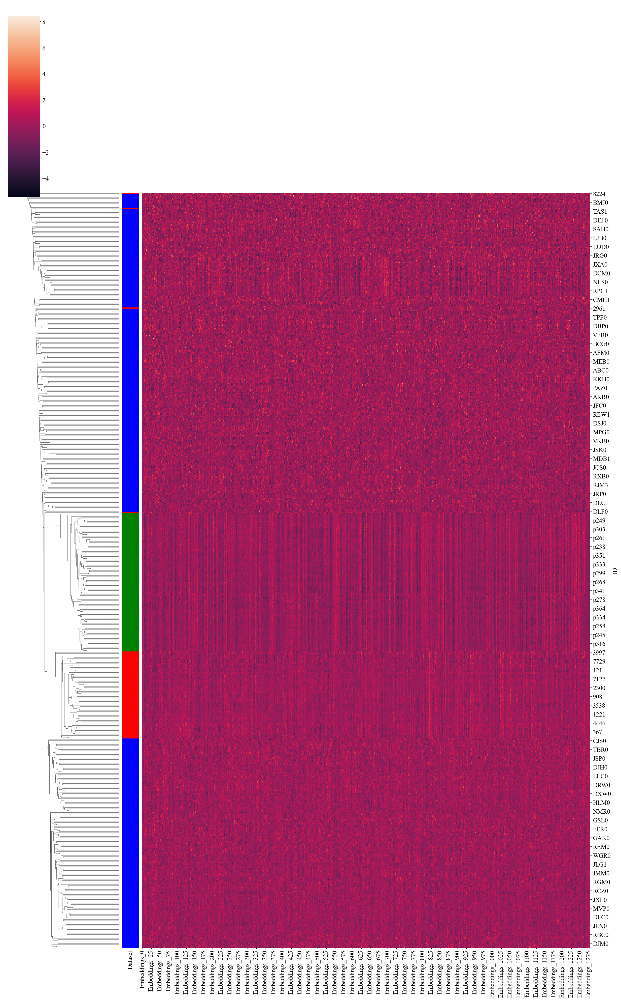

In [13]:
#standardize embeddings columns for better visualization
df_identity.drop(columns='Dataset', inplace=True)
df_identity = (df_identity-df_identity.mean())/df_identity.std()
#Plot cluster map
cluster_data = sns.clustermap(df_identity, col_cluster=False, figsize=(25, 40), row_colors=row_colors)
plt.savefig('clustermap.png')
plt.savefig('clustermap.pdf')

It looks like the speakers clustered together are usually from the same dataset. This is also reflected in the embeddings values pattern. Each dataset has its unique value pattern as shown in the heatmap texture. Thus, it seems that the model embeddings is also capturing dataset-specific information (i.e. microphone setup) and that's interesting since the three selected datasets have relatively clean backgrounds yet the model could observe some differences.

We further explore these dataset differences by computing different distance and correlation metrics and visualizing the distances across speakers.

## 4) Compute Distance Metrics

We computed the different distance and correlation metrics across the embeddings extracted from the best-performing layer in HuBERT on VoxCeleb dataset (Transformer layer 8). Then, we averaged the distances for each speaker to evaluate how far one speaker from the rest. The results are shown in the form of a heatmap for all 599 speakers and their distances between each other.

### 4.1. Standardized Euclidean Distance

In [14]:
#Load the euclidean distances across speakers in a long form
df_euclidean = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/seuclidean_matrix.csv', index_col='ID_1')

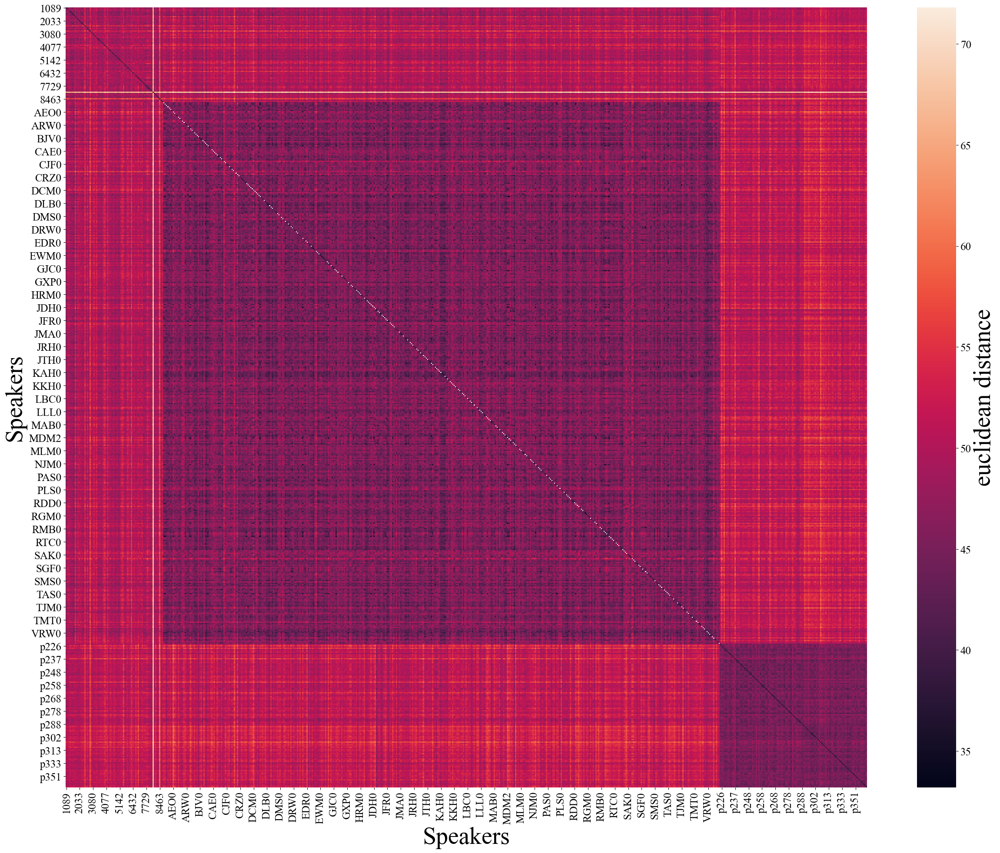

In [15]:
#Plot euclidean distances across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_euclidean, ax=ax)
ax.figure.axes[-1].set_ylabel('euclidean distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('euc_speaker_mat.png')
plt.savefig('euc_speaker_mat.pdf')

The above plot confirms the dataset-related effect. As shown above, speakers from the same dataset have smaller distances between their embeddings (e.g. big dark box is TIMIT and the small one is VCTK). However, it is not quite evident with Librispeech.

This observation might affect our stimuli selection because have small distance between speakers doesn't necessary mean similar voices but might also mean similar recording setup. Accordingly, we compute other distance metrics to better understand this issue.

The speakers in the y-axis are then sorted from the highest distance to lowest, as shown below. Thus, the speaker on the top is the furthest on average to all speakers, meaning that this speaker might be more distinct or unique. In simpler terms, the speakers are sorted from allegedly unique voices to more common and average voices.

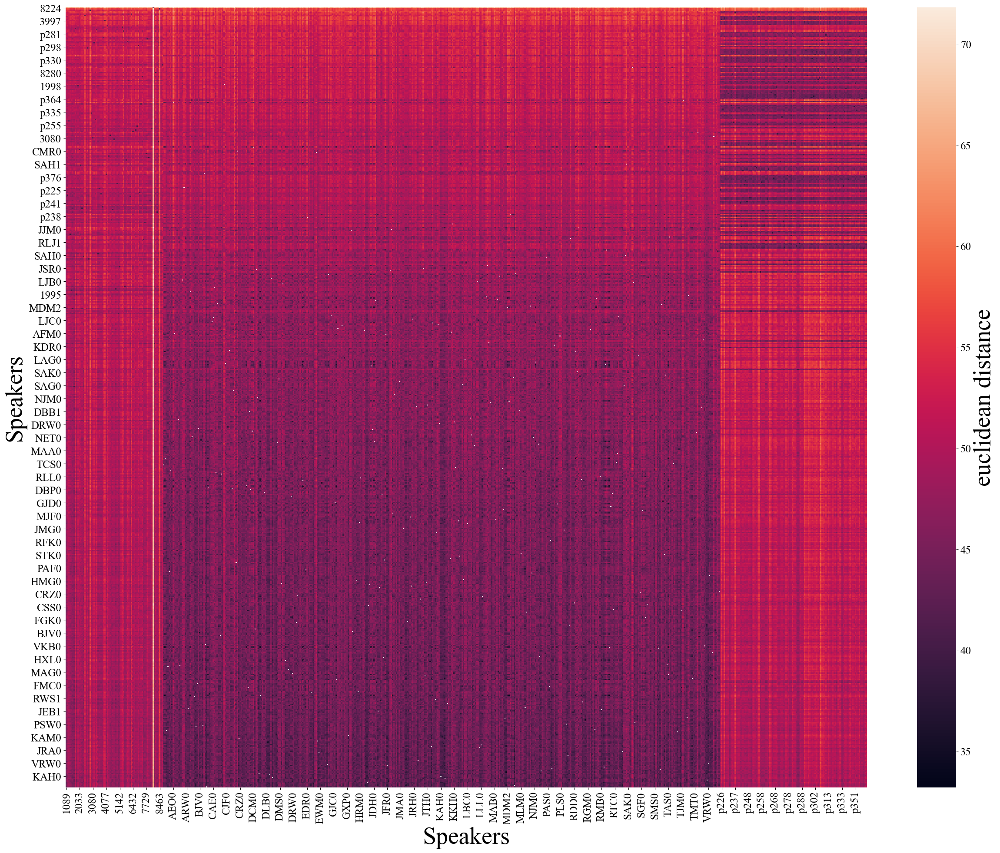

In [16]:
#Plot more-least common voice matrix
df_euclidean_sorted = df_euclidean.assign(m=df_euclidean.mean(axis=1)).sort_values('m', ascending=False).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_euclidean_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('euclidean distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('euc_sorted_speaker_mat.png')
plt.savefig('euc_sorted_speaker_mat.pdf')

In [17]:
#Sample from the speaker with the largest euclidean distance on average
import IPython
print(f'Speaker with the largest euclidean distance on average is {df_euclidean_sorted.index[0]}')
IPython.display.Audio(list(df.loc[df.ID == df_euclidean_sorted.index[0]]['Path'])[0])

Speaker with the largest euclidean distance on average is 8224


In [18]:
#Sample from the speaker with the smallest euclidean distance on average
import IPython
print(f'Speaker with the smallest euclidean distance on average is {df_euclidean_sorted.index[-1]}')
IPython.display.Audio(list(df.loc[df.ID == df_euclidean_sorted.index[-1]]['Path'])[0])

Speaker with the smallest euclidean distance on average is BNS0


We discarded the distances computed between:
1. Same Sex (e.g. to avoid trivial/easy trials in the experiment)
2. Different speakers uttering same scentence (to avoid similarities due to semantic information)
3. Same speaker uttering same scentence (i.e. same file, hence distance=0)

Below we plot the distribution of distances that were computed between different speakers against the ones computed between same speaker utterances.

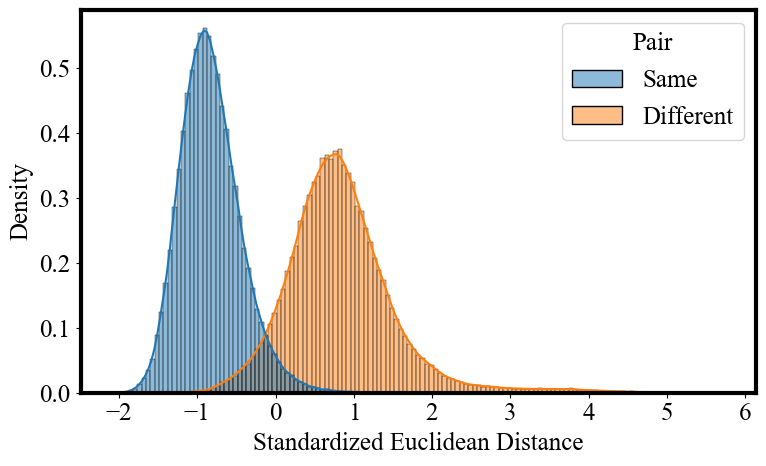

In [19]:
df_euclidean = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_seuclidean.csv')

df_same = df_euclidean.loc[df_euclidean.ID_1 == df_euclidean.ID_2]
#Sample a random set from the distances from different speakers because the number of different is higher than same samples
df_diff =df_euclidean.loc[df_euclidean.ID_1 != df_euclidean.ID_2].sample(len(df_same), random_state=42)
speaker_pair = ['Same']*len(df_same) + ['Different']*len(df_diff)
df_euclidean_concat = pd.concat([df_same, df_diff])
#Add column for same and different speakers
df_euclidean_concat['Pair'] = speaker_pair
#Standardize values
df_euclidean_concat.Distance = (df_euclidean_concat.Distance-df_euclidean_concat.Distance.mean())/df_euclidean_concat.Distance.std()

#Plot histogram
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_euclidean_concat, x='Distance', hue='Pair', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Standardized Euclidean Distance')
plt.tight_layout()
plt.savefig('euc_speaker_hist.png')
plt.savefig('euc_speaker_hist.pdf')

In [20]:
#select the "Same" pairs with max distance and the "Different" pairs with min distance
df_euclidean_overlap = df_euclidean_concat.loc[(df_euclidean_concat.Distance > -0.25) & (df_euclidean_concat.Distance < 0)]\
                                            .drop (columns=['Unnamed: 0', 'Unnamed: 0_1', 'Unnamed: 0_2'])
df_euclidean_overlap.to_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_overlapping_seuclidean.csv')
df_euclidean_overlap

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance,Sorted,Pair
48725821,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_054_mic1.flac,p225,54,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_128_mic1.flac,p225,128,F,-0.206976,p225_054_mic1.flac-p225_128_mic1.flac,Same
48728266,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_124_mic1.flac,p225,124,F,-0.223195,p225_066_mic1.flac-p225_124_mic1.flac,Same
48755149,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_238_mic1.flac,p225,238,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_357_mic1.flac,p225,357,F,-0.234630,p225_238_mic1.flac-p225_357_mic1.flac,Same
48769762,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_025_mic1.flac,p226,25,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_032_mic1.flac,p226,032,M,-0.071593,p226_025_mic1.flac-p226_032_mic1.flac,Same
48769763,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_025_mic1.flac,p226,25,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_068_mic1.flac,p226,068,M,-0.232061,p226_025_mic1.flac-p226_068_mic1.flac,Same
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3689071,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,1221-135767-0017_001.flac,1221,135767,F,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,6070-86744-0002_004.flac,6070,86744,F,-0.004551,1221-135767-0017_001.flac-6070-86744-0002_004....,Different
50374762,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p246_124_mic1.flac,p246,124,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p374_037_mic1.flac,p374,037,M,-0.232503,p246_124_mic1.flac-p374_037_mic1.flac,Different
48726173,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_054_mic1.flac,p225,54,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p239_039_mic1.flac,p239,039,F,-0.028349,p225_054_mic1.flac-p239_039_mic1.flac,Different
48810987,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_200_mic1.flac,p226,200,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p247_391_mic1.flac,p247,391,M,-0.024178,p226_200_mic1.flac-p247_391_mic1.flac,Different


### 4.2. Cosine Distance

In [21]:
#Load the cosine distances across speakers in a long form
df_cosine = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/cosine_matrix.csv', index_col='ID_1')

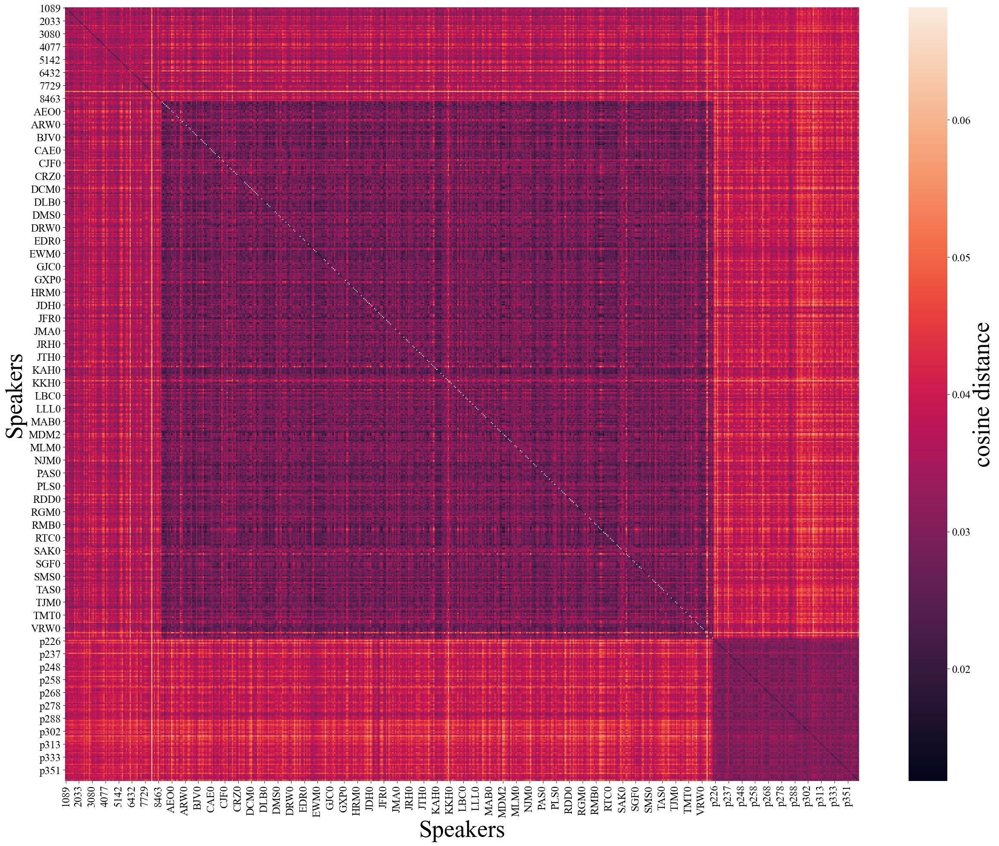

In [22]:
#Plot cosine distances across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_cosine, ax=ax)
ax.figure.axes[-1].set_ylabel('cosine distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('cosine_speaker_mat.png')
plt.savefig('cosine_speaker_mat.pdf')

The speakers in the y-axis are then sorted from the highest distance to lowest, as shown below. Thus, the speaker on the top is the furthest on average to all speakers, meaning that this speaker is more distinct or unique. In simpler terms, the speakers are sorted from unique voices to more common and average voices.

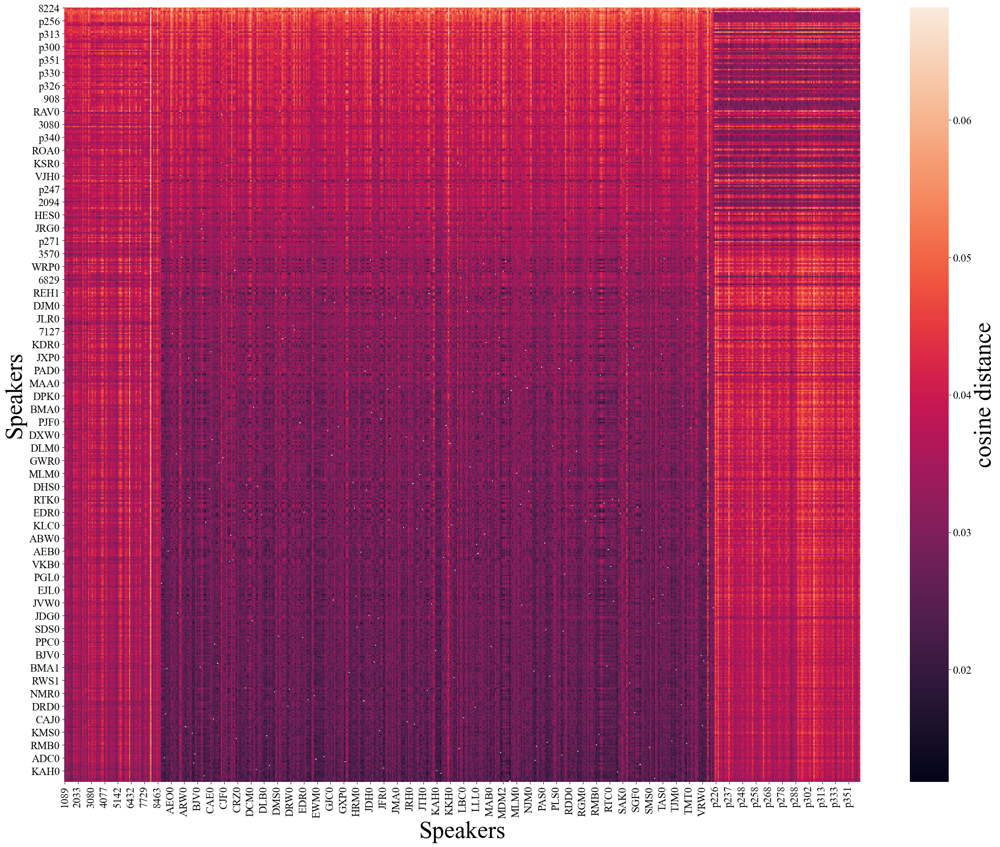

In [21]:
#Plot more-least common voice matrix
df_cosine_sorted = df_cosine.assign(m=df_cosine.mean(axis=1)).sort_values('m', ascending=False).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_cosine_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('cosine distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('cosine_sorted_speaker_mat.png')

In [23]:
#Sample from the speaker with the largest cosine distance on average
import IPython
print(f'Speaker with the largest cosine distance on average is {df_cosine_sorted.index[0]}')
IPython.display.Audio(list(df.loc[df.ID == df_cosine_sorted.index[0]]['Path'])[0])

NameError: name 'df_cosine_sorted' is not defined

In [ ]:
#Sample from the speaker with the smallest cosine distance on average
import IPython
print(f'Speaker with the smallest cosine distance on average is {df_cosine_sorted.index[-1]}')
IPython.display.Audio(list(df.loc[df.ID == df_cosine_sorted.index[-1]]['Path'])[0])

Below we plot the distribution of distances that were computed between different speakers against the ones computed between same speaker utterances.

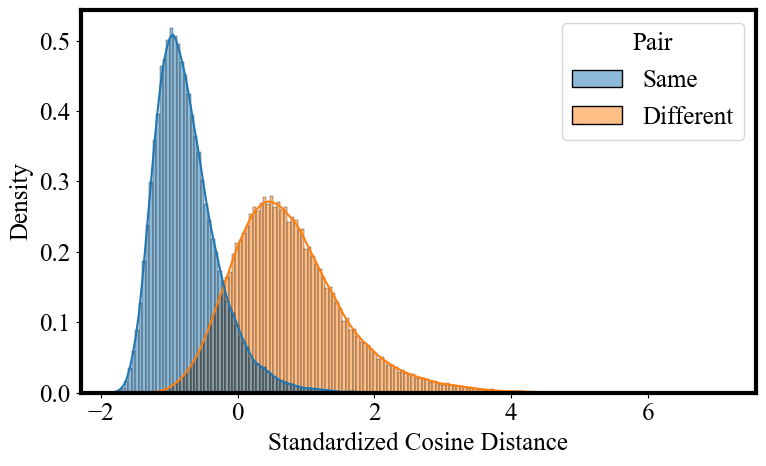

In [24]:
df_cosine = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_cosine.csv')

df_same = df_cosine.loc[df_cosine.ID_1 == df_cosine.ID_2]
#Sample a rondom set from the distances from different speakers because the number of different is higher than same samples
df_diff =df_cosine.loc[df_cosine.ID_1 != df_cosine.ID_2].sample(len(df_same), random_state=42)
speaker_pair = ['Same']*len(df_same) + ['Different']*len(df_diff)
df_cosine_concat = pd.concat([df_same, df_diff])
#Add column for same and different speakers
df_cosine_concat['Pair'] = speaker_pair
#Standardize values
df_cosine_concat.Distance = (df_cosine_concat.Distance-df_cosine_concat.Distance.mean())/df_cosine_concat.Distance.std()

#Plot histogram
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_cosine_concat, x='Distance', hue='Pair', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Standardized Cosine Distance')
plt.tight_layout()
plt.savefig('cosine_speaker_hist.png')
plt.savefig('cosine_speaker_hist.pdf')

In [25]:
#select pairs that have distances in the range from [-0.5, 0]
df_cosine_overlap = df_cosine_concat.loc[(df_cosine_concat.Distance > -0.25) & (df_cosine_concat.Distance < 0)]\
                                            .drop (columns=['Unnamed: 0', 'Unnamed: 0_1', 'Unnamed: 0_2'])
df_cosine_overlap.to_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_overlapping_cosine.csv')
df_cosine_overlap

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance,Sorted,Pair
48725815,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_054_mic1.flac,p225,54,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,066,F,-0.162239,p225_054_mic1.flac-p225_066_mic1.flac,Same
48725830,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_054_mic1.flac,p225,54,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_356_mic1.flac,p225,356,F,-0.217058,p225_054_mic1.flac-p225_356_mic1.flac,Same
48728262,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_072_mic1.flac,p225,072,F,-0.060075,p225_066_mic1.flac-p225_072_mic1.flac,Same
48728266,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_124_mic1.flac,p225,124,F,-0.168334,p225_066_mic1.flac-p225_124_mic1.flac,Same
48728276,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_356_mic1.flac,p225,356,F,-0.163459,p225_066_mic1.flac-p225_356_mic1.flac,Same
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10831915,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,2830-3979-0007_002.flac,2830,3979,M,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,6432-63722-0005_000.flac,6432,63722,M,-0.015112,2830-3979-0007_002.flac-6432-63722-0005_000.flac,Different
47453981,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,8131-117016-0047_000.flac,8131,117016,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p246_320_mic1.flac,p246,320,M,-0.113512,8131-117016-0047_000.flac-p246_320_mic1.flac,Different
47119629,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,7975-280076-0016_000.flac,7975,280076,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p363_317_mic1.flac,p363,317,M,-0.242023,7975-280076-0016_000.flac-p363_317_mic1.flac,Different
7500594,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,2094-142345-0008_003.flac,2094,142345,F,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,3575-170457-0003_001.flac,3575,170457,F,-0.139427,2094-142345-0008_003.flac-3575-170457-0003_001...,Different


### 4.3. Hausdorff Distance

In [26]:
#Load the hausdorff distances across speakers in a long form
df_hausdorff = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/hausdorff_matrix.csv', index_col='ID_1')

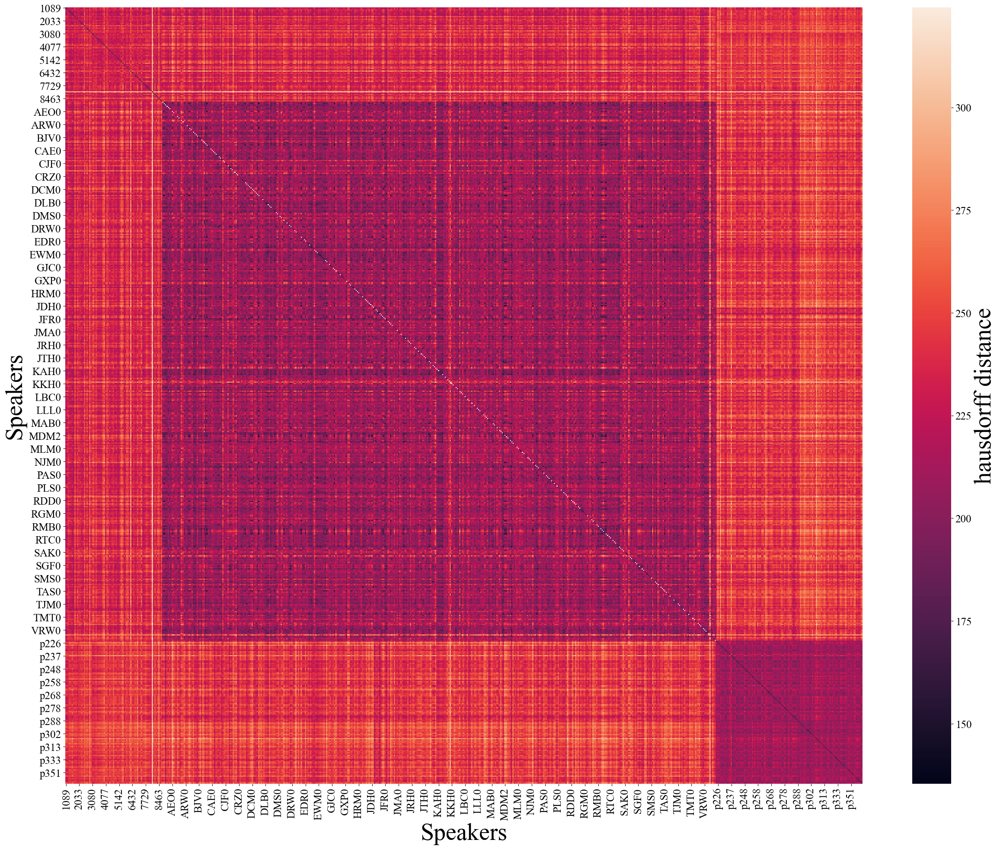

In [27]:
#Plot hausdorff distances across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_hausdorff, ax=ax)
ax.figure.axes[-1].set_ylabel('hausdorff distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('haus_speaker_mat.png')
plt.savefig('haus_speaker_mat.pdf')

The speakers in the y-axis are then sorted from the highest distance to lowest, as shown below. Thus, the speaker on the top is the furthest on average to all speakers, meaning that this speaker is more distinct or unique. In simpler terms, the speakers are sorted from unique voices to more common and average voices.

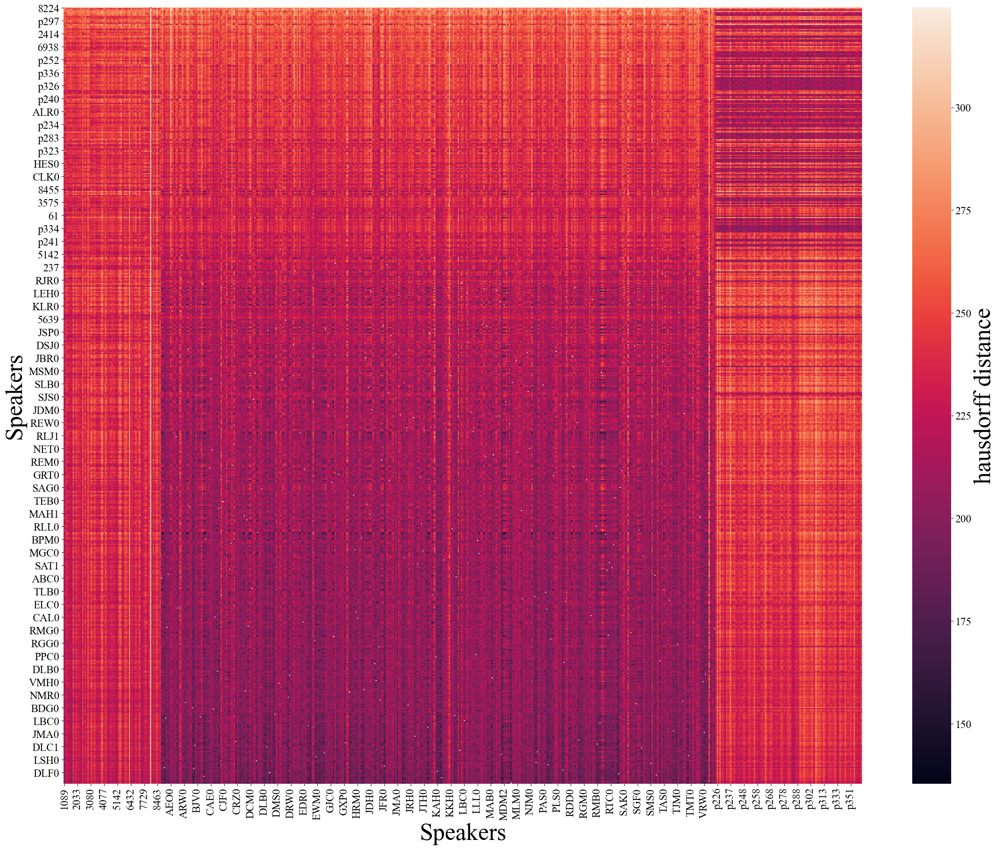

In [26]:
#Plot more-least common voice matrix
df_hausdorff_sorted = df_hausdorff.assign(m=df_hausdorff.mean(axis=1)).sort_values('m', ascending=False).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_hausdorff_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('hausdorff distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('haus_sorted_speaker_mat.png')

In [18]:
#Sample from the speaker with the largest hausdorff distance on average
import IPython
print(f'Speaker with the largest hausdorff distance on average is {df_hausdorff_sorted.index[0]}')
IPython.display.Audio(list(df.loc[df.ID == df_hausdorff_sorted.index[0]]['Path'])[0])

Speaker with the largest hausdorff distance on average is 8224


In [19]:
#Sample from the speaker with the smallest hausdorff distance on average
import IPython
print(f'Speaker with the smallest hausdorff distance on average is {df_hausdorff_sorted.index[-1]}')
IPython.display.Audio(list(df.loc[df.ID == df_hausdorff_sorted.index[-1]]['Path'])[0])

Speaker with the smallest hausdorff distance on average is MGG0


Below we plot the distribution of distances that were computed between different speakers against the ones computed between same speaker utterances.

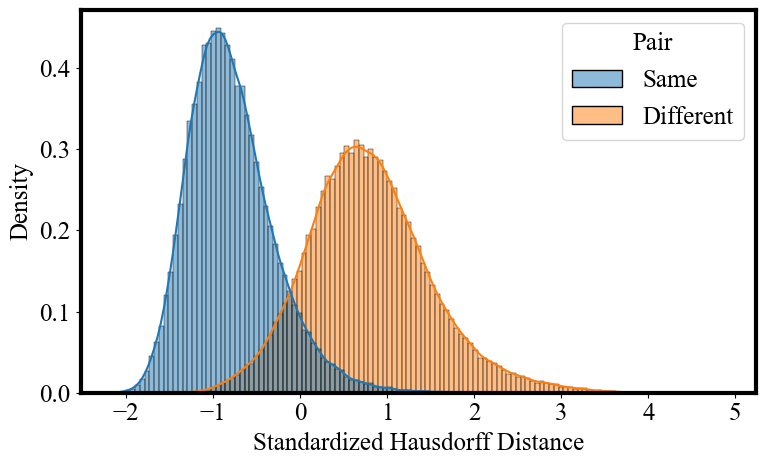

In [4]:
df_hausdorff = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_hausdorff.csv')

df_same = df_hausdorff.loc[df_hausdorff.ID_1 == df_hausdorff.ID_2]
#Sample a rondom set from the distances from different speakers because the number of different is higher than same samples
df_diff =df_hausdorff.loc[df_hausdorff.ID_1 != df_hausdorff.ID_2].sample(len(df_same), random_state=42)
speaker_pair = ['Same']*len(df_same) + ['Different']*len(df_diff)
df_hausdorff_concat = pd.concat([df_same, df_diff])
#Add column for same and different speakers
df_hausdorff_concat['Pair'] = speaker_pair
#Standardize values
df_hausdorff_concat.Distance = (df_hausdorff_concat.Distance-df_hausdorff_concat.Distance.mean())/df_hausdorff_concat.Distance.std()

#Plot histogram
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_hausdorff_concat, x='Distance', hue='Pair', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Standardized Hausdorff Distance')
plt.tight_layout()
plt.savefig('haus_speaker_hist.png')
plt.savefig('haus_speaker_hist.pdf')

In [28]:
#select pairs that have distances in the range from [-0.5, 0]
df_hausdorff_overlap = df_hausdorff_concat.loc[(df_hausdorff_concat.Distance > -0.25) & (df_hausdorff_concat.Distance < 0)]\
                                            .drop (columns=['Unnamed: 0', 'Unnamed: 0_1', 'Unnamed: 0_2'])
df_hausdorff_overlap.to_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_overlapping_hausdorff.csv')
df_hausdorff_overlap

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance,Sorted,Pair
48725815,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_054_mic1.flac,p225,54,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,066,F,-0.234535,p225_054_mic1.flac-p225_066_mic1.flac,Same
48725821,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_054_mic1.flac,p225,54,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_128_mic1.flac,p225,128,F,-0.232320,p225_054_mic1.flac-p225_128_mic1.flac,Same
48728262,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_072_mic1.flac,p225,072,F,-0.125529,p225_066_mic1.flac-p225_072_mic1.flac,Same
48728266,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_124_mic1.flac,p225,124,F,-0.179034,p225_066_mic1.flac-p225_124_mic1.flac,Same
48733161,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_081_mic1.flac,p225,81,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_128_mic1.flac,p225,128,F,-0.239986,p225_081_mic1.flac-p225_128_mic1.flac,Same
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45327780,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,6432-63723-0029_003.flac,6432,63723,M,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR3/MA...,SX107.WAV,ADC0,SX107,M,-0.087656,6432-63723-0029_003.flac-SX107.WAV,Different
50374762,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p246_124_mic1.flac,p246,124,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p374_037_mic1.flac,p374,037,M,-0.200102,p246_124_mic1.flac-p374_037_mic1.flac,Different
14604847,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,3729-6852-0033_008.flac,3729,6852,F,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,6070-86744-0027_002.flac,6070,86744,F,-0.053575,3729-6852-0033_008.flac-6070-86744-0027_002.flac,Different
47453981,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,8131-117016-0047_000.flac,8131,117016,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p246_320_mic1.flac,p246,320,M,-0.024251,8131-117016-0047_000.flac-p246_320_mic1.flac,Different


### 4.4. Spearman Correlation

In [5]:
#Load the spearman correlation across speakers in a long form
df_spearman = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/spearman_matrix.csv', index_col='ID_1')

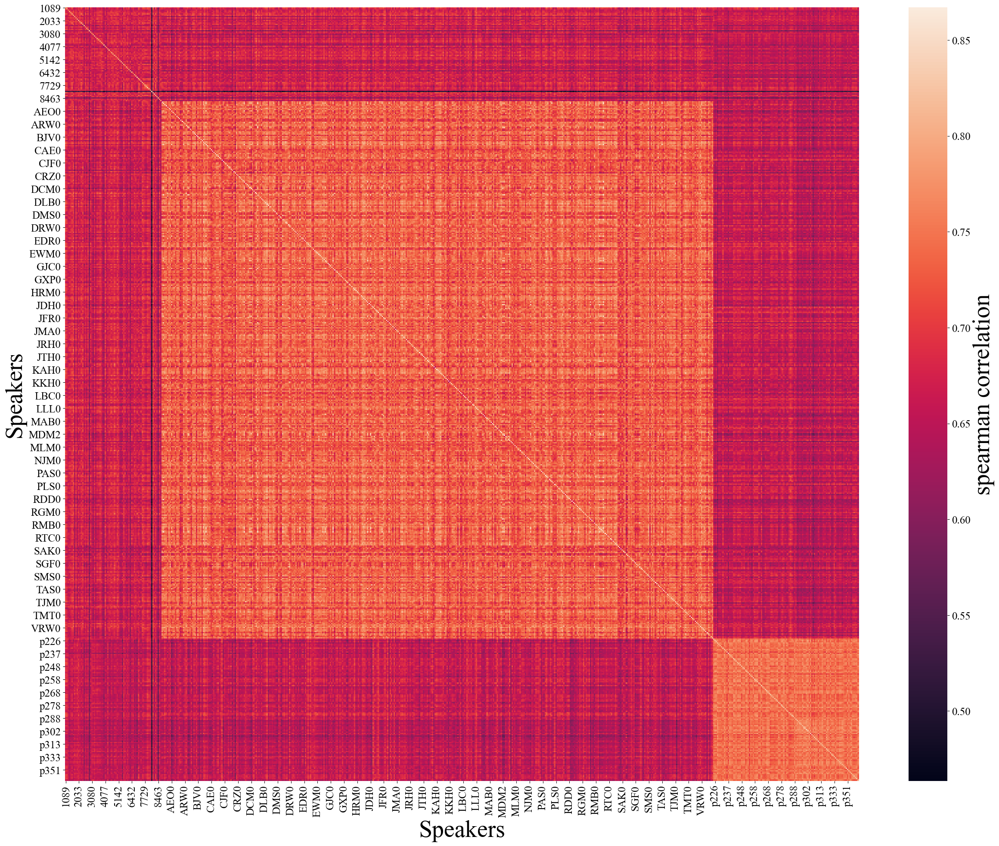

In [6]:
#Plot spearman correlation across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_spearman, ax=ax)
ax.figure.axes[-1].set_ylabel('spearman correlation', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('spear_speaker_mat.png')
plt.savefig('spear_speaker_mat.pdf')

The speakers in the y-axis are then sorted from the highest distance to lowest, as shown below. Thus, the speaker on the top is the furthest on average to all speakers, meaning that this speaker is more distinct or unique. In simpler terms, the speakers are sorted from unique voices to more common and average voices.

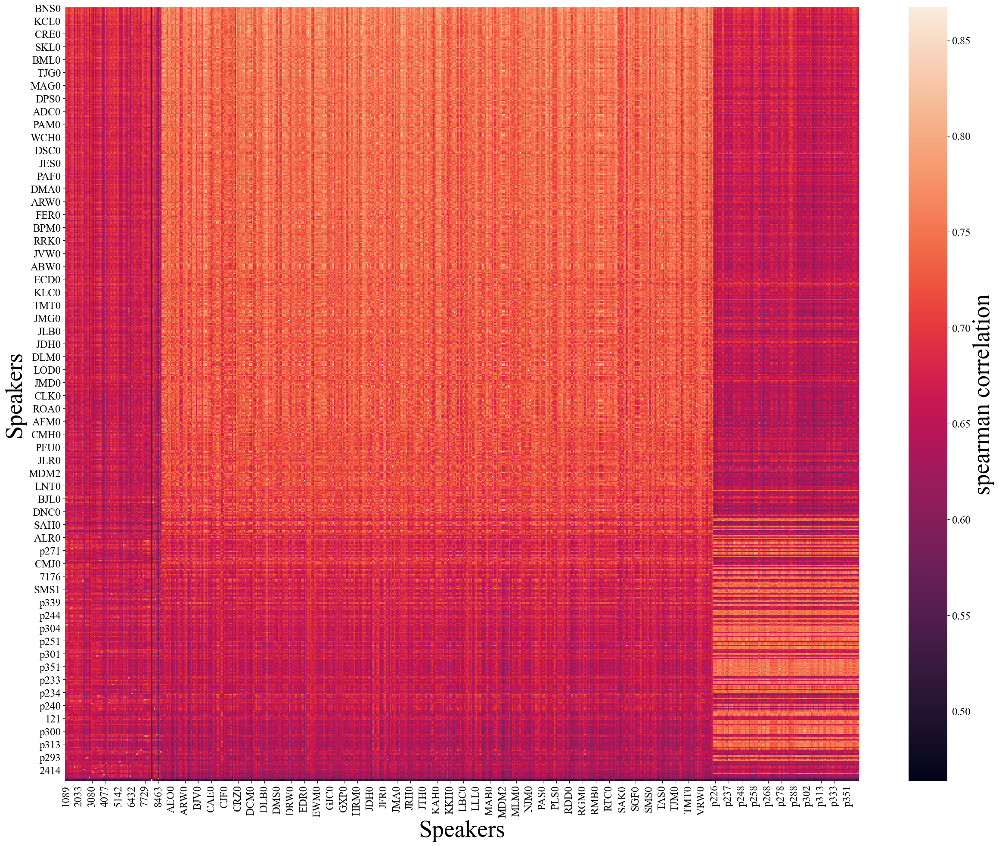

In [31]:
#Plot more-least common voice matrix
df_spearman_sorted = df_spearman.assign(m=df_spearman.mean(axis=1)).sort_values('m', ascending=False).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_spearman_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('spearman correlation', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()
plt.savefig('spear_sorted_speaker_mat.png')

In [35]:
#Sample from the speaker with the largest spearman distance on average
import IPython
print(f'Speaker with the largest spearman correlation on average is {df_spearman_sorted.index[0]}')
IPython.display.Audio(list(df.loc[df.ID == df_spearman_sorted.index[0]]['Path'])[0])

Speaker with the largest spearman correlation on average is BNS0


In [36]:
#Sample from the speaker with the smallest spearman correlation on average
import IPython
print(f'Speaker with the smallest spearman correlation on average is {df_spearman_sorted.index[-1]}')
IPython.display.Audio(list(df.loc[df.ID == df_spearman_sorted.index[-1]]['Path'])[0])

Speaker with the smallest spearman correlation on average is 8224


Below we plot the distribution of distances that were computed between different speakers against the ones computed between same speaker utterances.

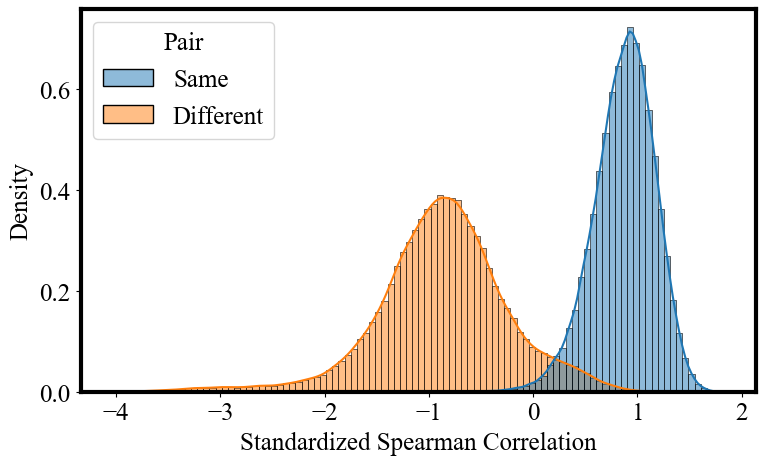

In [7]:
df_spearman = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_spearman.csv')

df_same = df_spearman.loc[df_spearman.ID_1 == df_spearman.ID_2]
#Sample a rondom set from the distances from different speakers because the number of different is higher than same samples
df_diff =df_spearman.loc[df_spearman.ID_1 != df_spearman.ID_2].sample(len(df_same), random_state=42)
speaker_pair = ['Same']*len(df_same) + ['Different']*len(df_diff)
df_spearman_concat = pd.concat([df_same, df_diff])
#Add column for same and different speakers
df_spearman_concat['Pair'] = speaker_pair
#Standardize values
df_spearman_concat.Distance = (df_spearman_concat.Distance-df_spearman_concat.Distance.mean())/df_spearman_concat.Distance.std()

#Plot histogram
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_spearman_concat, x='Distance', hue='Pair', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Standardized Spearman Correlation')
plt.tight_layout()
plt.savefig('spear_speaker_hist.png')
plt.savefig('spear_speaker_hist.pdf')

In [ ]:
#select pairs that have distances in the range from [0.25, 0.5]
df_spearman_overlap = df_spearman_concat.loc[(df_spearman_concat.Distance > 0) & (df_spearman_concat.Distance < 0.5)]\
                                            .drop (columns=['Unnamed: 0', 'Unnamed: 0_1', 'Unnamed: 0_2'])
df_spearman_overlap.to_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_overlapping_spearman.csv')
df_spearman_overlap

## 5) Stimuli Selection

We looked at the selected pairs from each metric and selected the common pairs, as shown below.

In [24]:
#merge all metrics dfs based on the common pairs
df_stimuli = df_euclidean_overlap.merge(df_cosine_overlap, on = list(df_cosine_overlap.columns)[:-3]+['Pair'], how ='inner', suffixes=('_seuc', '_cos'))
df_stimuli = df_stimuli.merge(df_hausdorff_overlap, on=list(df_cosine_overlap.columns)[:-3]+['Pair'], how='inner', suffixes=('_x', '_haus'))
df_stimuli = df_stimuli.merge(df_spearman_overlap, on=list(df_cosine_overlap.columns)[:-3]+['Pair'], how='inner', suffixes=('_haus', '_spear'))
df_stimuli = df_stimuli.loc[:,~df_stimuli.columns.str.startswith('Sorted')]
#this is the list of common pairs across all metrics
df_stimuli

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear
0,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_124_mic1.flac,p225,124,F,-0.223195,Same,-0.168334,-0.179034,0.326033
1,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_031_mic1.flac,p226,31,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_294_mic1.flac,p226,294,M,-0.202814,Same,-0.009393,-0.015428,0.409696
2,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_294_mic1.flac,p226,294,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_336_mic1.flac,p226,336,M,-0.054476,Same,-0.054125,-0.062519,0.498872
3,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_320_mic1.flac,p226,320,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_326_mic1.flac,p226,326,M,-0.150349,Same,-0.019963,-0.028639,0.339494
4,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p227_063_mic1.flac,p227,63,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p227_359_mic1.flac,p227,359,M,-0.099690,Same,-0.248580,-0.218664,0.485712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1117,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,3729-6852-0014_000.flac,3729,6852,F,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,4507-16021-0030_000.flac,4507,16021,F,-0.043753,Different,-0.028288,-0.034072,0.133931
1118,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p238_274_mic1.flac,p238,274,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p343_389_mic1.flac,p343,389,F,-0.149931,Different,-0.116173,-0.091366,0.082844
1119,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p236_222_mic1.flac,p236,222,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p310_026_mic1.flac,p310,026,F,-0.001385,Different,-0.096643,-0.204608,0.347653
1120,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p234_158_mic1.flac,p234,158,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p295_078_mic1.flac,p295,078,F,-0.143867,Different,-0.067536,-0.092149,0.205937


In [25]:
df_stimuli.to_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_overlapping_stimuli.csv')

In [27]:
df_stimuli.Pair.value_counts()

Same         670
Different    452
Name: Pair, dtype: int64

In [78]:
speakers = list(df_stimuli.ID_1.unique()) + list(df_stimuli.ID_2.unique())
unique_speakers = np.unique(np.array(speakers)).shape[0]
print(f'Number of speakers: {unique_speakers}')

Number of speakers: 112


Then, we compute an average score across all metrics (seuclidean, cosine, hausdorff, and 1-spearman). Consequently pick the lowest 50 *Different* pairs and the highest *Same* pairs.

In [30]:
#compute 1-spearman
df_stimuli['Distance_1-spear'] = 1-df_stimuli['Distance_spear']
df_stimuli

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear
0,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_066_mic1.flac,p225,66,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p225_124_mic1.flac,p225,124,F,-0.223195,Same,-0.168334,-0.179034,0.326033,0.673967
1,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_031_mic1.flac,p226,31,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_294_mic1.flac,p226,294,M,-0.202814,Same,-0.009393,-0.015428,0.409696,0.590304
2,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_294_mic1.flac,p226,294,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_336_mic1.flac,p226,336,M,-0.054476,Same,-0.054125,-0.062519,0.498872,0.501128
3,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_320_mic1.flac,p226,320,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p226_326_mic1.flac,p226,326,M,-0.150349,Same,-0.019963,-0.028639,0.339494,0.660506
4,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p227_063_mic1.flac,p227,63,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p227_359_mic1.flac,p227,359,M,-0.099690,Same,-0.248580,-0.218664,0.485712,0.514288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1117,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,3729-6852-0014_000.flac,3729,6852,F,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,4507-16021-0030_000.flac,4507,16021,F,-0.043753,Different,-0.028288,-0.034072,0.133931,0.866069
1118,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p238_274_mic1.flac,p238,274,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p343_389_mic1.flac,p343,389,F,-0.149931,Different,-0.116173,-0.091366,0.082844,0.917156
1119,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p236_222_mic1.flac,p236,222,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p310_026_mic1.flac,p310,026,F,-0.001385,Different,-0.096643,-0.204608,0.347653,0.652347
1120,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p234_158_mic1.flac,p234,158,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p295_078_mic1.flac,p295,078,F,-0.143867,Different,-0.067536,-0.092149,0.205937,0.794063


In [31]:
#compute average score of all metrics and sort df by score
df_stimuli['Score'] = df_stimuli[['Distance_seuc', 'Distance_cos', 'Distance_haus', 'Distance_1-spear']].mean(axis=1)
df_stimuli = df_stimuli.sort_values(by='Score')

In [32]:
df_stimuli.drop_duplicates(subset=['Path_1'], inplace=True)
df_stimuli.drop_duplicates(subset=['Path_2'], inplace=True)
df_stimuli.reset_index(drop=True, inplace=True)
df_stimuli

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score
0,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p251_293_mic1.flac,p251,293,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p251_307_mic1.flac,p251,307,M,-0.248660,Same,-0.242693,-0.234697,0.470874,0.529126,-0.049231
1,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p310_253_mic1.flac,p310,253,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p310_389_mic1.flac,p310,389,F,-0.241215,Same,-0.218418,-0.233742,0.483422,0.516578,-0.044200
2,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p228_031_mic1.flac,p228,31,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p228_162_mic1.flac,p228,162,F,-0.238944,Same,-0.241953,-0.184878,0.487618,0.512382,-0.038348
3,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p272_201_mic1.flac,p272,201,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p272_354_mic1.flac,p272,354,M,-0.235211,Same,-0.234927,-0.188644,0.492216,0.507784,-0.037750
4,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p330_314_mic1.flac,p330,314,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p330_407_mic1.flac,p330,407,F,-0.225916,Same,-0.233449,-0.244074,0.437822,0.562178,-0.035315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p233_112_mic1.flac,p233,112,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p244_070_mic1.flac,p244,070,F,-0.007283,Different,-0.093864,-0.061389,0.024758,0.975242,0.203176
746,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_328_mic1.flac,p250,328,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_336_mic1.flac,p250,336,F,-0.155929,Same,-0.010805,-0.004142,0.013593,0.986407,0.203883
747,/om2/user/gelbanna/datasets/LibriSpeech/LibriS...,2033-164915-0007_003.flac,2033,164915,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p286_170_mic1.flac,p286,170,M,-0.039996,Different,-0.087459,-0.041890,0.000932,0.999068,0.207431
748,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p244_153_mic1.flac,p244,153,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p317_115_mic1.flac,p317,115,F,-0.073483,Different,-0.019653,-0.009870,0.048566,0.951434,0.212107


In [79]:
#remove librispeech samples
df_stimuli['Dataset'] = df_stimuli.apply(lambda x: x.Path_1.split('/')[5], axis=1)
df_stimuli = df_stimuli.loc[df_stimuli.Dataset != 'LibriSpeech']
df_stimuli

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score,Dataset
0,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p251_293_mic1.flac,p251,293,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p251_307_mic1.flac,p251,307,M,-0.248660,Same,-0.242693,-0.234697,0.470874,0.529126,-0.049231,VCTK
1,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p310_253_mic1.flac,p310,253,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p310_389_mic1.flac,p310,389,F,-0.241215,Same,-0.218418,-0.233742,0.483422,0.516578,-0.044200,VCTK
2,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p228_031_mic1.flac,p228,31,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p228_162_mic1.flac,p228,162,F,-0.238944,Same,-0.241953,-0.184878,0.487618,0.512382,-0.038348,VCTK
3,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p272_201_mic1.flac,p272,201,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p272_354_mic1.flac,p272,354,M,-0.235211,Same,-0.234927,-0.188644,0.492216,0.507784,-0.037750,VCTK
4,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p330_314_mic1.flac,p330,314,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p330_407_mic1.flac,p330,407,F,-0.225916,Same,-0.233449,-0.244074,0.437822,0.562178,-0.035315,VCTK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p259_365_mic1.flac,p259,365,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p259_448_mic1.flac,p259,448,M,-0.092803,Same,-0.034297,-0.009083,0.078840,0.921160,0.196244,VCTK
745,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p233_112_mic1.flac,p233,112,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p244_070_mic1.flac,p244,070,F,-0.007283,Different,-0.093864,-0.061389,0.024758,0.975242,0.203176,VCTK
746,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_328_mic1.flac,p250,328,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_336_mic1.flac,p250,336,F,-0.155929,Same,-0.010805,-0.004142,0.013593,0.986407,0.203883,VCTK
748,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p244_153_mic1.flac,p244,153,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p317_115_mic1.flac,p317,115,F,-0.073483,Different,-0.019653,-0.009870,0.048566,0.951434,0.212107,VCTK


In [80]:
same_pair_stimuli = df_stimuli.loc[df_stimuli.Pair=='Same'].nlargest(50, 'Score')
diff_pair_stimuli = df_stimuli.loc[df_stimuli.Pair=='Different'].nsmallest(50, 'Score')
df_final_stimuli = pd.concat([same_pair_stimuli, diff_pair_stimuli])
df_final_stimuli

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score,Dataset
746,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_328_mic1.flac,p250,328,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_336_mic1.flac,p250,336,F,-0.155929,Same,-0.010805,-0.004142,0.013593,0.986407,0.203883,VCTK
744,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p259_365_mic1.flac,p259,365,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p259_448_mic1.flac,p259,448,M,-0.092803,Same,-0.034297,-0.009083,0.078840,0.921160,0.196244,VCTK
733,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p282_085_mic1.flac,p282,85,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p282_255_mic1.flac,p282,255,F,-0.003462,Same,-0.033151,-0.019005,0.228394,0.771606,0.178997,VCTK
726,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p276_109_mic1.flac,p276,109,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p276_354_mic1.flac,p276,354,F,-0.048144,Same,-0.102157,-0.059222,0.099974,0.900026,0.172626,VCTK
723,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p283_158_mic1.flac,p283,158,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p283_426_mic1.flac,p283,426,F,-0.120538,Same,-0.041693,-0.007461,0.160425,0.839575,0.167471,VCTK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p239_408_mic1.flac,p239,408,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p265_162_mic1.flac,p265,162,F,-0.142909,Different,-0.148815,-0.166151,0.393555,0.606445,0.037143,VCTK
219,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p300_306_mic1.flac,p300,306,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p340_112_mic1.flac,p340,112,F,-0.217894,Different,-0.044626,-0.085674,0.498755,0.501245,0.038263,VCTK
223,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p313_327_mic1.flac,p313,327,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p351_201_mic1.flac,p351,201,F,-0.112352,Different,-0.150413,-0.124937,0.454467,0.545533,0.039457,VCTK
225,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p228_163_mic1.flac,p228,163,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p269_110_mic1.flac,p269,110,F,-0.111640,Different,-0.218158,-0.142772,0.366446,0.633554,0.040246,VCTK


In [81]:
speakers = list(df_final_stimuli.ID_1.unique()) + list(df_final_stimuli.ID_2.unique())
unique_speakers = np.unique(np.array(speakers))
print(f'Number of speakers: {unique_speakers.shape[0]}')
unique_speakers

Number of speakers: 77


array(['p226', 'p227', 'p228', 'p231', 'p232', 'p233', 'p234', 'p237',
       'p238', 'p239', 'p240', 'p243', 'p244', 'p246', 'p247', 'p249',
       'p250', 'p252', 'p253', 'p254', 'p255', 'p256', 'p259', 'p261',
       'p262', 'p263', 'p264', 'p265', 'p267', 'p268', 'p269', 'p270',
       'p271', 'p272', 'p273', 'p274', 'p276', 'p277', 'p278', 'p279',
       'p282', 'p283', 'p284', 'p285', 'p286', 'p288', 'p292', 'p294',
       'p297', 'p300', 'p302', 'p304', 'p308', 'p310', 'p312', 'p313',
       'p314', 'p315', 'p316', 'p318', 'p323', 'p326', 'p329', 'p330',
       'p333', 'p334', 'p335', 'p336', 'p339', 'p340', 'p341', 'p345',
       'p351', 'p361', 'p363', 'p374', 'p376'], dtype='<U4')

In [82]:
files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())
unique_files = np.unique(np.array(files))
print(f'Number of unique Audio files: {unique_files.shape[0]}')

Number of unique Audio files: 199


## 6) Add Background Noise

Here, we add background noise to the selected 100 pairs so the task could be challenging for human subjects. The idea is to provide the subjects with pairs of 3sec utterances, one clip with clean background and the other is noisy to prevent subjects from judging based on enviromental setup (e.g. microphone, or background ambience). The order of noisy and clean clips will be balanced across 100 trials (i.e. 50 trials noisy-clean, 50 trials clean-noisy) with randomized trials for all subjects.

In [48]:
# Normalize the loudness of the final stimuli set and save normalized audio files
audio_files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())
for file in tqdm(audio_files):
    audio, sr = sf.read(file)
    norm_audio = normalize_loudness(audio, sr, -23)
    path = file.split('.')[0]
    audio_format = file.split('.')[1]
    sf.write(f'{path}_norm.{audio_format}', norm_audio, sr)

100%|████████████████████████████████████████████| 200/200 [00:06<00:00, 32.80it/s]


In [57]:
# First measure the loudness of audio files after normalization and before adding noise
audio_files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())
loudness = []
for file in tqdm(audio_files):
    path = file.split('.')[0]
    audio_format = file.split('.')[1]
    file = f'{path}_norm.{audio_format}'
    audio, sr = sf.read(file)
    loudness.append(measure_loudness(audio, sr))
    
print(f'The mean loudness value is {np.mean(loudness)} with SD {np.std(loudness)}')

100%|███████████████████████████████████████████| 200/200 [00:01<00:00, 115.81it/s]

The mean loudness value is -23.000004142204435 with SD 8.883168205567422e-05


In [11]:
# First measure the loudness of audio files after normalization and before adding noise
audio_files = glob('/om2/scratch/Tue/gelbanna/VCTK/wav48_silence_trimmed/*/*.flac')
loudness = []
for file in tqdm(audio_files):
    audio, sr = sf.read(file)
    loudness.append(measure_loudness(audio, sr))
    
print(f'The mean loudness value is {np.mean(loudness)} with SD {np.std(loudness)}')

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25510/25510 [05:16<00:00, 80.70it/s]

The mean loudness value is -23.03070281459939 with SD 0.6000527613308487


In [58]:
import torchaudio
import soundfile as sf
from torchaudio_augmentations import *

audio_files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())

for file in tqdm(audio_files):
    path = file.split('.')[0]
    audio_format = file.split('.')[1]
    file = f'{path}_norm.{audio_format}'
    audio, sr = torchaudio.load(file)

    #define noise function
    transforms = [
        Noise(min_snr=0.5, max_snr=0.5)
    ]
    transform = Compose(transforms=transforms)
    #add white noise
    transformed_audio =  transform(audio)
    #save new audio file
    path = file.split('.')[0]
    audio_format = file.split('.')[1]
    torchaudio.save(f'{path}_noise.{audio_format}', transformed_audio, sr)

100%|████████████████████████████████████████████| 200/200 [00:05<00:00, 35.79it/s]


In [59]:
#Measure the loudness of audio files after adding noise
audio_files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())
loudness = []
for file in tqdm(audio_files):
    path = file.split('.')[0]
    audio_format = file.split('.')[1]
    file = f'{path}_norm_noise.{audio_format}'
    audio, sr = sf.read(file)
    loudness.append(measure_loudness(audio, sr))
    
print(f'The mean loudness value is {np.mean(loudness)} with SD {np.std(loudness)}')

100%|███████████████████████████████████████████| 200/200 [00:01<00:00, 115.11it/s]

The mean loudness value is -23.20435041667869 with SD 0.7250973881551366


In [83]:
def update_name(row):
    path = row.split('.')[0]
    audio_format = row.split('.')[1]
    return f'{path}_norm.{audio_format}'
#Update audio paths with normalized ones
df_final_stimuli.Path_1 = df_final_stimuli.apply(lambda x: update_name(x.Path_1), axis=1)
df_final_stimuli.Path_2 = df_final_stimuli.apply(lambda x: update_name(x.Path_2), axis=1)
df_final_stimuli.FileName_1 = df_final_stimuli.apply(lambda x: update_name(x.FileName_1), axis=1)
df_final_stimuli.FileName_2 = df_final_stimuli.apply(lambda x: update_name(x.FileName_2), axis=1)

In [84]:
def add_noisy_stimuli(row):
    file_name = row.split('.')[0]
    audio_format = file.split('.')[1]
    return f'{file_name}_noise.{audio_format}'

In [85]:
noisy_same_idx = same_pair_stimuli.sample(n=25, random_state=42).index.to_list()
noisy_diff_idx = diff_pair_stimuli.sample(n=25, random_state=42).index.to_list()
noisy_first_idx = noisy_same_idx + noisy_diff_idx

df_final_stimuli.loc[noisy_first_idx, 'Path_1'] = df_final_stimuli['Path_1'].apply(lambda x: add_noisy_stimuli(x))
df_final_stimuli.loc[noisy_first_idx, 'FileName_1'] = df_final_stimuli['FileName_1'].apply(lambda x: add_noisy_stimuli(x))
df_final_stimuli.loc[~df_final_stimuli.index.isin(noisy_first_idx), 'Path_2'] = df_final_stimuli['Path_2'].apply(lambda x: add_noisy_stimuli(x))
df_final_stimuli.loc[~df_final_stimuli.index.isin(noisy_first_idx), 'FileName_2'] = df_final_stimuli['FileName_2'].apply(lambda x: add_noisy_stimuli(x))

In [86]:
df_final_stimuli['Order'] = df_final_stimuli.apply(lambda x: 'N-C' if 'noise' in x.FileName_1 else 'C-N', axis=1)
df_final_stimuli

,Path_1,FileName_1,ID_1,Scentence_1,Sex_1,Path_2,FileName_2,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score,Dataset,Order
746,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_328_mic1_norm.flac,p250,328,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p250_336_mic1_norm_noise.flac,p250,336,F,-0.155929,Same,-0.010805,-0.004142,0.013593,0.986407,0.203883,VCTK,C-N
744,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p259_365_mic1_norm.flac,p259,365,M,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p259_448_mic1_norm_noise.flac,p259,448,M,-0.092803,Same,-0.034297,-0.009083,0.078840,0.921160,0.196244,VCTK,C-N
733,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p282_085_mic1_norm.flac,p282,85,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p282_255_mic1_norm_noise.flac,p282,255,F,-0.003462,Same,-0.033151,-0.019005,0.228394,0.771606,0.178997,VCTK,C-N
726,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p276_109_mic1_norm_noise.flac,p276,109,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p276_354_mic1_norm.flac,p276,354,F,-0.048144,Same,-0.102157,-0.059222,0.099974,0.900026,0.172626,VCTK,N-C
723,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p283_158_mic1_norm_noise.flac,p283,158,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p283_426_mic1_norm.flac,p283,426,F,-0.120538,Same,-0.041693,-0.007461,0.160425,0.839575,0.167471,VCTK,N-C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p239_408_mic1_norm_noise.flac,p239,408,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p265_162_mic1_norm.flac,p265,162,F,-0.142909,Different,-0.148815,-0.166151,0.393555,0.606445,0.037143,VCTK,N-C
219,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p300_306_mic1_norm_noise.flac,p300,306,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p340_112_mic1_norm.flac,p340,112,F,-0.217894,Different,-0.044626,-0.085674,0.498755,0.501245,0.038263,VCTK,N-C
223,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p313_327_mic1_norm_noise.flac,p313,327,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p351_201_mic1_norm.flac,p351,201,F,-0.112352,Different,-0.150413,-0.124937,0.454467,0.545533,0.039457,VCTK,N-C
225,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p228_163_mic1_norm_noise.flac,p228,163,F,/om2/user/gelbanna/datasets/VCTK/wav48_silence...,p269_110_mic1_norm.flac,p269,110,F,-0.111640,Different,-0.218158,-0.142772,0.366446,0.633554,0.040246,VCTK,N-C


## 7) Save Stimuli for Gorilla

In [88]:
#Measure the loudness of audio files after adding noise
audio_files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())
loudness = []
for file in tqdm(audio_files):
    audio, sr = sf.read(file)
    loudness.append(measure_loudness(audio, sr))
    
print(f'The mean loudness value is {np.mean(loudness)} with SD {np.std(loudness)}')

100%|██████████████████████████████████████████████████████████████████████████████| 200/200 [00:02<00:00, 91.37it/s]

The mean loudness value is -23.09146468959339 with SD 0.5044085390997558


In [74]:
#make directory for final selected stimuli
os.makedirs(f'../pilot_stimuli', exist_ok=True)
#move all selected stimuli to the new directory
audio_files = list(df_final_stimuli.Path_1.unique()) + list(df_final_stimuli.Path_2.unique())
for file in tqdm(audio_files):
    os.system(f"cp {file} ../pilot_stimuli/{file.split('/')[-1]}")

100%|████████████████████| 200/200 [03:50<00:00,  1.15s/it]


In [75]:
df_final_stimuli.to_csv('../pilot_stimuli/pilot_stimuli.csv')

In [96]:
#generate white noise clip to be used between pairs of audio
noise = np.random.normal(0, 1, size=32000).astype(np.float32)
noise = normalize_loudness(noise, 16000, -23)
sf.write(f'noise.wav', noise, 16000)

## 8) Filter Subjects Data

We have ran the experiment on [Gorilla](https://gorilla.sc/) platform with the generated stimuli. We launched a pilot on 7 subjects to test the experiment design. Then, we eventually launched the experiment on [Prolific](https://www.prolific.co/) with a target of 105 subjects.

In this section, we are filtering the participants' data to finally approve/reject their submission.

Rejection Criteria:
1. Failing the screening tests (Broweser Autoplay Check and Headphone Check)
2. Timing out (taking more 40 mins to finish the experiment)
3. Exiting the experiment early
4. Performing poorly on the main task (<60%)

In [5]:
df_stimuli = pd.read_csv('../pilot_stimuli/pilot_stimuli.csv', index_col=0)
df_stimuli.drop(columns=['Path_1','FileName_1','Path_2','FileName_2'], inplace=True)
stimuli_columns = df_stimuli.columns.tolist()
stimuli_columns

['ID_1',
 'Scentence_1',
 'Sex_1',
 'ID_2',
 'Scentence_2',
 'Sex_2',
 'Distance_seuc',
 'Pair',
 'Distance_cos',
 'Distance_haus',
 'Distance_spear',
 'Distance_1-spear',
 'Score',
 'Dataset',
 'Order']

In [116]:
#read experiment file
df_data = pd.read_csv('/om2/user/gelbanna/data_exp_96310-v32_task-wqkb.csv')
columns_of_interest = ['Participant Public ID', 'Screen Name', 'Zone Name', 'Reaction Time', 'Response'] + stimuli_columns
df_data.sample(10)

,Event Index,UTC Timestamp,UTC Date,Local Timestamp,Local Timezone,Local Date,Experiment ID,Experiment Version,Tree Node Key,Repeat Key,...,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score,Dataset,Order
6734,292,1.676051e+12,10/02/2023 17:35:44,1.676051e+12,-5.0,10/02/2023 12:35:43,96310.0,32.0,task-wqkb,NaN,...,F,-0.248817,Different,-0.184732,-0.221842,0.177876,0.822124,0.041683,VCTK,C-N
22400,226,1.676051e+12,10/02/2023 17:48:43,1.676051e+12,-5.0,10/02/2023 12:48:43,96310.0,32.0,task-wqkb,NaN,...,M,-0.197417,Different,-0.238199,-0.246589,0.237473,0.762527,0.020080,VCTK,C-N
31638,164,1.676051e+12,10/02/2023 17:48:07,1.676051e+12,-5.0,10/02/2023 12:48:07,96310.0,32.0,task-wqkb,NaN,...,F,-0.142572,Same,-0.104735,-0.031755,0.284691,0.715309,0.109062,VCTK,C-N
44961,617,1.676052e+12,10/02/2023 18:05:32,1.676052e+12,-7.0,10/02/2023 11:05:31,96310.0,32.0,task-wqkb,NaN,...,M,-0.095414,Different,-0.245430,-0.199929,0.320745,0.679255,0.034620,VCTK,C-N
47797,593,1.676053e+12,10/02/2023 18:12:18,1.676053e+12,-6.0,10/02/2023 12:12:18,96310.0,32.0,task-wqkb,NaN,...,F,-0.185660,Different,-0.087412,-0.158882,0.429627,0.570373,0.034605,VCTK,C-N
69723,339,1.676061e+12,10/02/2023 20:33:58,1.676061e+12,-6.0,10/02/2023 14:33:43,96310.0,32.0,task-wqkb,NaN,...,F,-0.224405,Different,-0.170544,-0.204142,0.405286,0.594714,-0.001094,VCTK,N-C
82729,471,1.676388e+12,14/02/2023 15:24:42,1.676388e+12,-5.0,14/02/2023 10:24:41,96310.0,32.0,task-wqkb,NaN,...,F,-0.150650,Same,-0.049596,-0.020481,0.338525,0.661475,0.110187,VCTK,N-C
43904,275,1.676052e+12,10/02/2023 17:55:42,1.676052e+12,-5.0,10/02/2023 12:55:42,96310.0,32.0,task-wqkb,NaN,...,F,-0.155929,Same,-0.010805,-0.004142,0.013593,0.986407,0.203883,VCTK,C-N
14752,444,1.676051e+12,10/02/2023 17:49:27,1.676051e+12,-6.0,10/02/2023 11:49:26,96310.0,32.0,task-wqkb,NaN,...,F,-0.155929,Same,-0.010805,-0.004142,0.013593,0.986407,0.203883,VCTK,C-N
77689,438,1.676315e+12,13/02/2023 18:58:20,1.676315e+12,-8.0,13/02/2023 10:58:20,96310.0,32.0,task-wqkb,NaN,...,F,-0.246319,Different,-0.210595,-0.178851,0.253871,0.746129,0.027591,VCTK,N-C


#### **Filter Columns**

In [117]:
#drop all columns except the ones of interest
df_data = df_data.loc[:, columns_of_interest]
df_data

,Participant Public ID,Screen Name,Zone Name,Reaction Time,Response,ID_1,Scentence_1,Sex_1,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score,Dataset,Order
0,63e5a6690eeedc20da056717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,63e5a6690eeedc20da056717,Screen 1,advancementZone,23184.099999964237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,63e5a6690eeedc20da056717,Screen 1,Zone1,0.3999999761581421,AUDIO PLAY REQUESTED,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,63e5a6690eeedc20da056717,Screen 1,Zone1,2820.899999976158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,63e5a6690eeedc20da056717,Screen 2,Zone1,0.3999999761581421,AUDIO PLAY REQUESTED,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82970,60c93f189082587ea79ce324,Audio_2,Zone1,2825.0,NaN,p310,131.0,F,p310,139.0,F,-0.119581,Same,-0.010628,-0.013524,0.249284,0.750716,0.151746,VCTK,N-C
82971,60c93f189082587ea79ce324,Decision,Different,1993.4,2,p310,131.0,F,p310,139.0,F,-0.119581,Same,-0.010628,-0.013524,0.249284,0.750716,0.151746,VCTK,N-C
82972,60c93f189082587ea79ce324,Screen 1,advancementZone,5839.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
82973,60c93f189082587ea79ce324,NaN,NaN,1346359.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### **Filter Rows**

In [118]:
#keep only the rows that show the subjects' response (100/speaker with total of 106 speakers = 10600 rows)
df_data = df_data.loc[df_data['Screen Name'] == 'Decision']
df_data['Reaction Time'] = df_data['Reaction Time'].astype(float)

In [119]:
df_data

,Participant Public ID,Screen Name,Zone Name,Reaction Time,Response,ID_1,Scentence_1,Sex_1,ID_2,Scentence_2,Sex_2,Distance_seuc,Pair,Distance_cos,Distance_haus,Distance_spear,Distance_1-spear,Score,Dataset,Order
16,63e5a6690eeedc20da056717,Decision,Different,4115.2,3,p244,185.0,F,p262,204.0,F,-0.137859,Different,-0.239637,-0.240457,0.415821,0.584179,-0.008444,VCTK,C-N
23,63e5a6690eeedc20da056717,Decision,Same,1686.2,3,p294,126.0,F,p294,227.0,F,-0.105503,Same,-0.058449,-0.082362,0.330988,0.669012,0.105674,VCTK,N-C
30,63e5a6690eeedc20da056717,Decision,Same,6366.8,1,p252,228.0,M,p270,335.0,M,-0.165034,Different,-0.203257,-0.166883,0.354687,0.645313,0.027535,VCTK,N-C
37,63e5a6690eeedc20da056717,Decision,Different,1976.8,5,p292,124.0,M,p363,309.0,M,-0.095414,Different,-0.245430,-0.199929,0.320745,0.679255,0.034620,VCTK,C-N
44,63e5a6690eeedc20da056717,Decision,Different,1065.4,7,p270,339.0,M,p270,398.0,M,-0.104159,Same,-0.014413,-0.014558,0.304394,0.695606,0.140619,VCTK,N-C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82943,60c93f189082587ea79ce324,Decision,Different,926.9,7,p240,235.0,F,p261,362.0,F,-0.182286,Different,-0.241073,-0.221857,0.238521,0.761479,0.029066,VCTK,C-N
82950,60c93f189082587ea79ce324,Decision,Different,1698.5,7,p318,277.0,F,p318,322.0,F,-0.145597,Same,-0.037927,-0.088886,0.294501,0.705499,0.108272,VCTK,C-N
82957,60c93f189082587ea79ce324,Decision,Same,2096.8,3,p227,119.0,M,p259,77.0,M,-0.190037,Different,-0.249842,-0.131921,0.493739,0.506261,-0.016385,VCTK,C-N
82964,60c93f189082587ea79ce324,Decision,Different,2313.7,4,p239,245.0,F,p239,459.0,F,-0.053240,Same,-0.037786,-0.063568,0.401464,0.598536,0.110985,VCTK,N-C


In [120]:
def compute_dprime(subject_data):
    true_diff = subject_data.apply(lambda x: 1 if x['Zone Name'] == 'Different' and x['Zone Name'] == x['Pair'] else 0, axis=1).sum()
    true_same = subject_data.apply(lambda x: 1 if x['Zone Name'] == 'Same' and x['Zone Name'] == x['Pair'] else 0, axis=1).sum()
    # z-scores
    hitZ = stats.norm.ppf(true_diff/50)
    faZ  = stats.norm.ppf((50-true_same)/50)
    return hitZ-faZ

def f(x):
    d = {}
    d['Accuracy'] = len(x[x['Zone Name'] == x['Pair']])
    d['Mean_Reaction_Time'] = np.mean(x['Reaction Time'])
    true_diff = x.apply(lambda x: 1 if x['Zone Name'] == 'Different' and x['Zone Name'] == x['Pair'] else 0, axis=1).sum()
    true_same = x.apply(lambda x: 1 if x['Zone Name'] == 'Same' and x['Zone Name'] == x['Pair'] else 0, axis=1).sum()
    d['True_Different'] = true_diff/50
    d['True_Same'] = true_same/50
    d['d_prime'] = compute_dprime(x)
    return pd.Series(d, index=['Accuracy', 'Mean_Reaction_Time', 'True_Different', 'True_Same', 'd_prime'])
#group data by subject ID and compute accuracy per subject
subjects_results = df_data.groupby('Participant Public ID').apply(f)

In [121]:
subjects_results.sort_values(by='d_prime', ascending=False)

,Accuracy,Mean_Reaction_Time,True_Different,True_Same,d_prime
Participant Public ID,,,,,
60ce4fceb13609a2c039248e,82.0,1793.080,1.00,0.64,inf
5d1555fe628de0001966c2fa,91.0,1651.530,0.90,0.92,2.686623
63d7aa4a4f19508a5401cc2a,90.0,2016.880,0.92,0.88,2.580058
5be8eaff0e366e00017616ad,87.0,2425.132,0.96,0.78,2.522879
59025dfc57d9f20001bc66e3,83.0,1379.828,0.68,0.98,2.521448
...,...,...,...,...,...
62e9731465fb490879d942c7,51.0,18271.041,0.92,0.10,0.123520
56dfb1516b4093000dd8ca21,50.0,16837.111,0.98,0.02,0.000000
63ae37cd63c8a6ca8b9cf4ad,49.0,4538.891,0.70,0.28,-0.058441


In [53]:
#show subjects with less than 60% accuracy (around chance level)
rejected_subjects = subjects_results.loc[subjects_results.Accuracy > 60]
rejected_subjects

,Accuracy,Mean_Reaction_Time,True_Different,True_Same,d_prime
Participant Public ID,,,,,
559e82dffdf99b7a9a124180,73.0,3111.271,0.74,0.72,1.226187
55a9f6a1fdf99b2d81b5295f,80.0,4427.520,0.84,0.76,1.700760
55d35447da14d7000e95318f,85.0,3009.800,0.96,0.74,2.394031
5678ea0289319e00116519c3,71.0,1704.352,0.80,0.62,1.147102
57dd186e6598aa0001992616,80.0,2055.916,0.88,0.72,1.757828
...,...,...,...,...,...
63e54774b0629d1ed9ce9a60,78.0,2536.047,0.74,0.82,1.558710
63e55e08efd239a8c8b9d39e,83.0,2011.740,0.86,0.80,1.921941
63e5a6690eeedc20da056717,77.0,1885.693,0.92,0.62,1.710552
